# PREDICT THE BURNED AREA OF FOREST FIRES WITH NEURAL NETWORKS

In [1]:
# Importing Necessary Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as pe
import statsmodels.api as sm
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import classification_report
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from tensorflow.keras.layers import Dense,Dropout
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
from keras.models import Sequential
from tensorflow.keras.optimizers import Adam,RMSprop
from sklearn.model_selection import GridSearchCV,KFold
import warnings

warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize'] = (15,8)
plt.rcParams['figure.dpi'] = 250
sns.set_style(style='darkgrid')
plt.tight_layout()
%matplotlib inline

In [2]:
ff = pd.read_csv(r"C:\Users\DELL\OneDrive\Desktop\assignment\15\forestfires.csv")
ff

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
0,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,...,0,0,0,0,1,0,0,0,0,small
1,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,...,0,0,0,0,0,0,0,1,0,small
2,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,...,0,0,0,0,0,0,0,1,0,small
3,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,...,0,0,0,0,1,0,0,0,0,small
4,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,...,0,0,0,0,1,0,0,0,0,small
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,aug,sun,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,...,0,0,0,0,0,0,0,0,0,large
513,aug,sun,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,...,0,0,0,0,0,0,0,0,0,large
514,aug,sun,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,...,0,0,0,0,0,0,0,0,0,large
515,aug,sat,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,...,0,0,0,0,0,0,0,0,0,small


In [3]:
ff.columns

Index(['month', 'day', 'FFMC', 'DMC', 'DC', 'ISI', 'temp', 'RH', 'wind',
       'rain', 'area', 'dayfri', 'daymon', 'daysat', 'daysun', 'daythu',
       'daytue', 'daywed', 'monthapr', 'monthaug', 'monthdec', 'monthfeb',
       'monthjan', 'monthjul', 'monthjun', 'monthmar', 'monthmay', 'monthnov',
       'monthoct', 'monthsep', 'size_category'],
      dtype='object')

# Performing EDA In Dataset

In [4]:
ff.describe(include='all')

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
count,517,517,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,...,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517
unique,12,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
top,aug,sun,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,small
freq,184,95,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,378
mean,NaN,NaN,90.644681,110.872340,547.940039,9.021663,18.889168,44.288201,4.017602,0.021663,...,0.038685,0.003868,0.061896,0.032882,0.104449,0.003868,0.001934,0.029014,0.332689,NaN
std,NaN,NaN,5.520111,64.046482,248.066192,4.559477,5.806625,16.317469,1.791653,0.295959,...,0.193029,0.062137,0.241199,0.178500,0.306138,0.062137,0.043980,0.168007,0.471632,NaN
min,NaN,NaN,18.700000,1.100000,7.900000,0.000000,2.200000,15.000000,0.400000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
25%,NaN,NaN,90.200000,68.600000,437.700000,6.500000,15.500000,33.000000,2.700000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
50%,NaN,NaN,91.600000,108.300000,664.200000,8.400000,19.300000,42.000000,4.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
75%,NaN,NaN,92.900000,142.400000,713.900000,10.800000,22.800000,53.000000,4.900000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,NaN


In [5]:
ff.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517 entries, 0 to 516
Data columns (total 31 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   month          517 non-null    object 
 1   day            517 non-null    object 
 2   FFMC           517 non-null    float64
 3   DMC            517 non-null    float64
 4   DC             517 non-null    float64
 5   ISI            517 non-null    float64
 6   temp           517 non-null    float64
 7   RH             517 non-null    int64  
 8   wind           517 non-null    float64
 9   rain           517 non-null    float64
 10  area           517 non-null    float64
 11  dayfri         517 non-null    int64  
 12  daymon         517 non-null    int64  
 13  daysat         517 non-null    int64  
 14  daysun         517 non-null    int64  
 15  daythu         517 non-null    int64  
 16  daytue         517 non-null    int64  
 17  daywed         517 non-null    int64  
 18  monthapr  

In [6]:
ff.isna().sum()

month            0
day              0
FFMC             0
DMC              0
DC               0
ISI              0
temp             0
RH               0
wind             0
rain             0
area             0
dayfri           0
daymon           0
daysat           0
daysun           0
daythu           0
daytue           0
daywed           0
monthapr         0
monthaug         0
monthdec         0
monthfeb         0
monthjan         0
monthjul         0
monthjun         0
monthmar         0
monthmay         0
monthnov         0
monthoct         0
monthsep         0
size_category    0
dtype: int64

In [7]:
col=['month', 'day', 'size_category']
for i in col:
    print(ff[i].value_counts())

aug    184
sep    172
mar     54
jul     32
feb     20
jun     17
oct     15
apr      9
dec      9
jan      2
may      2
nov      1
Name: month, dtype: int64
sun    95
fri    85
sat    84
mon    74
tue    64
thu    61
wed    54
Name: day, dtype: int64
small    378
large    139
Name: size_category, dtype: int64


In [8]:
ff[ff.duplicated()]

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
53,aug,wed,92.1,111.2,654.1,9.6,20.4,42,4.9,0.0,...,0,0,0,0,0,0,0,0,0,small
100,aug,sun,91.4,142.4,601.4,10.6,19.8,39,5.4,0.0,...,0,0,0,0,0,0,0,0,0,small
215,mar,sat,91.7,35.8,80.8,7.8,17.0,27,4.9,0.0,...,0,0,0,0,1,0,0,0,0,large
303,jun,fri,91.1,94.1,232.1,7.1,19.2,38,4.5,0.0,...,0,0,0,1,0,0,0,0,0,small
426,aug,thu,91.6,248.4,753.8,6.3,20.4,56,2.2,0.0,...,0,0,0,0,0,0,0,0,0,small
461,aug,sat,93.7,231.1,715.1,8.4,18.9,64,4.9,0.0,...,0,0,0,0,0,0,0,0,0,small
501,aug,tue,96.1,181.1,671.2,14.3,21.6,65,4.9,0.8,...,0,0,0,0,0,0,0,0,0,small
508,aug,fri,91.0,166.9,752.6,7.1,25.9,41,3.6,0.0,...,0,0,0,0,0,0,0,0,0,small


In [9]:
ff.drop_duplicates(inplace = True)
ff[ff.duplicated()]

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category


In [10]:
# Reseting Index
ff.reset_index(inplace=True)
ff.drop(columns='index',inplace=True)

ff

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
0,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,...,0,0,0,0,1,0,0,0,0,small
1,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,...,0,0,0,0,0,0,0,1,0,small
2,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,...,0,0,0,0,0,0,0,1,0,small
3,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,...,0,0,0,0,1,0,0,0,0,small
4,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,...,0,0,0,0,1,0,0,0,0,small
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
504,aug,sun,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,...,0,0,0,0,0,0,0,0,0,large
505,aug,sun,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,...,0,0,0,0,0,0,0,0,0,large
506,aug,sun,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,...,0,0,0,0,0,0,0,0,0,large
507,aug,sat,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,...,0,0,0,0,0,0,0,0,0,small


# Visualization

<AxesSubplot:>

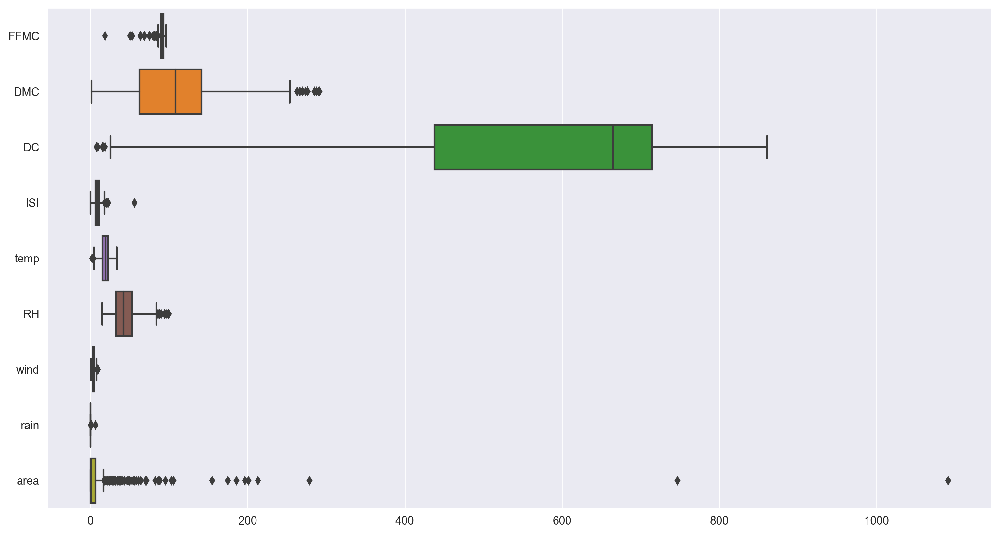

In [11]:
sns.cubehelix_palette(as_cmap=True)
sns.boxplot(data=ff.iloc[:,2:11],orient='h')

array([[<AxesSubplot:title={'center':'FFMC'}>,
        <AxesSubplot:title={'center':'DMC'}>,
        <AxesSubplot:title={'center':'DC'}>],
       [<AxesSubplot:title={'center':'ISI'}>,
        <AxesSubplot:title={'center':'temp'}>,
        <AxesSubplot:title={'center':'RH'}>],
       [<AxesSubplot:title={'center':'wind'}>,
        <AxesSubplot:title={'center':'rain'}>,
        <AxesSubplot:title={'center':'area'}>]], dtype=object)

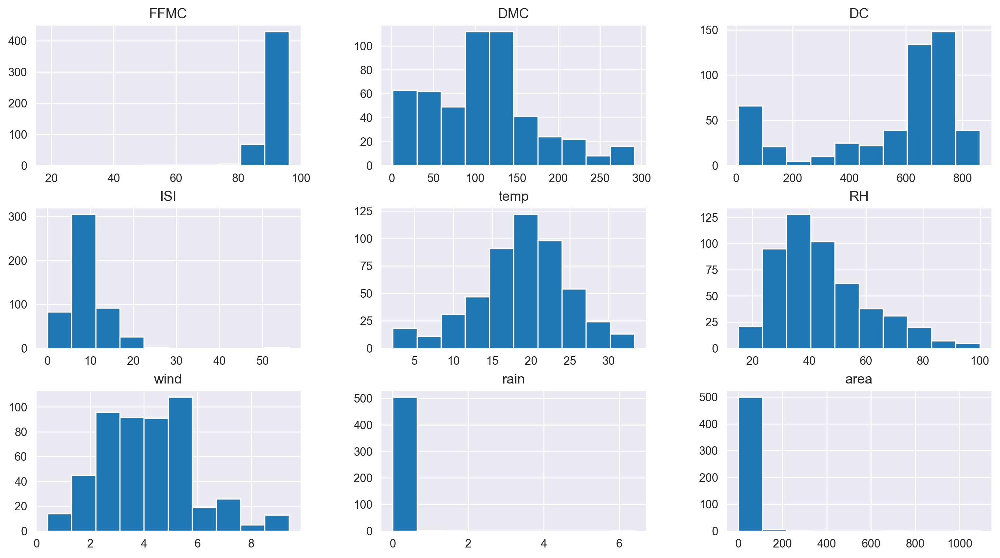

In [12]:
# Ploting Histplot
ff.iloc[:,2:11].hist()

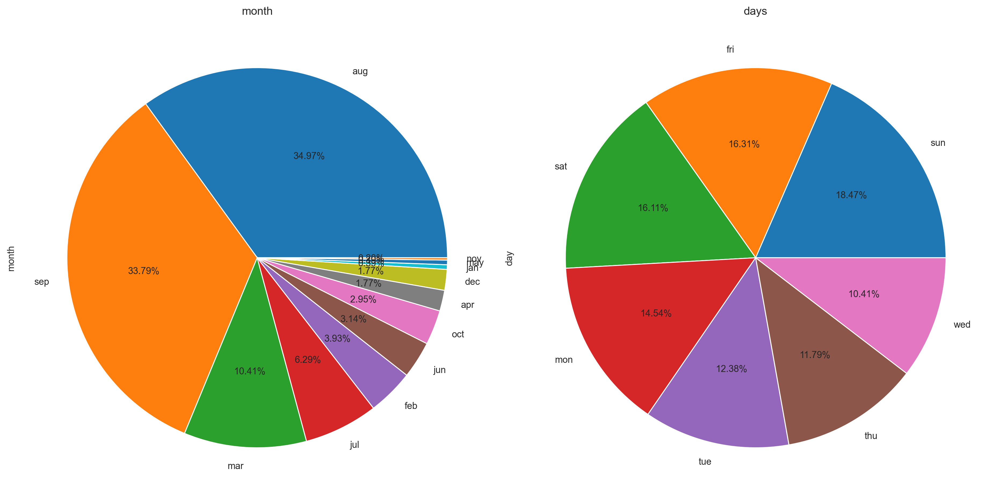

In [13]:
# Ploting Pie-Plot
fig, ax = plt.subplots(ncols=2)
ax[0].title.set_text('month')
ff['month'].value_counts().plot(kind='pie', autopct = '%0.2f%%', ax= ax[0])
ax[1].title.set_text('days')
ff['day'].value_counts().plot(kind='pie', autopct = '%0.2f%%', ax= ax[1])
plt.tight_layout()

# Correlation Analysis

In [14]:
p = ff.iloc[:,2:11]
p['s'] = ff['size_category']

p

,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,s
0,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.00,small
1,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.00,small
2,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.00,small
3,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.00,small
4,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.00,small
...,...,...,...,...,...,...,...,...,...,...
504,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,6.44,large
505,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,54.29,large
506,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,11.16,large
507,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,0.00,small


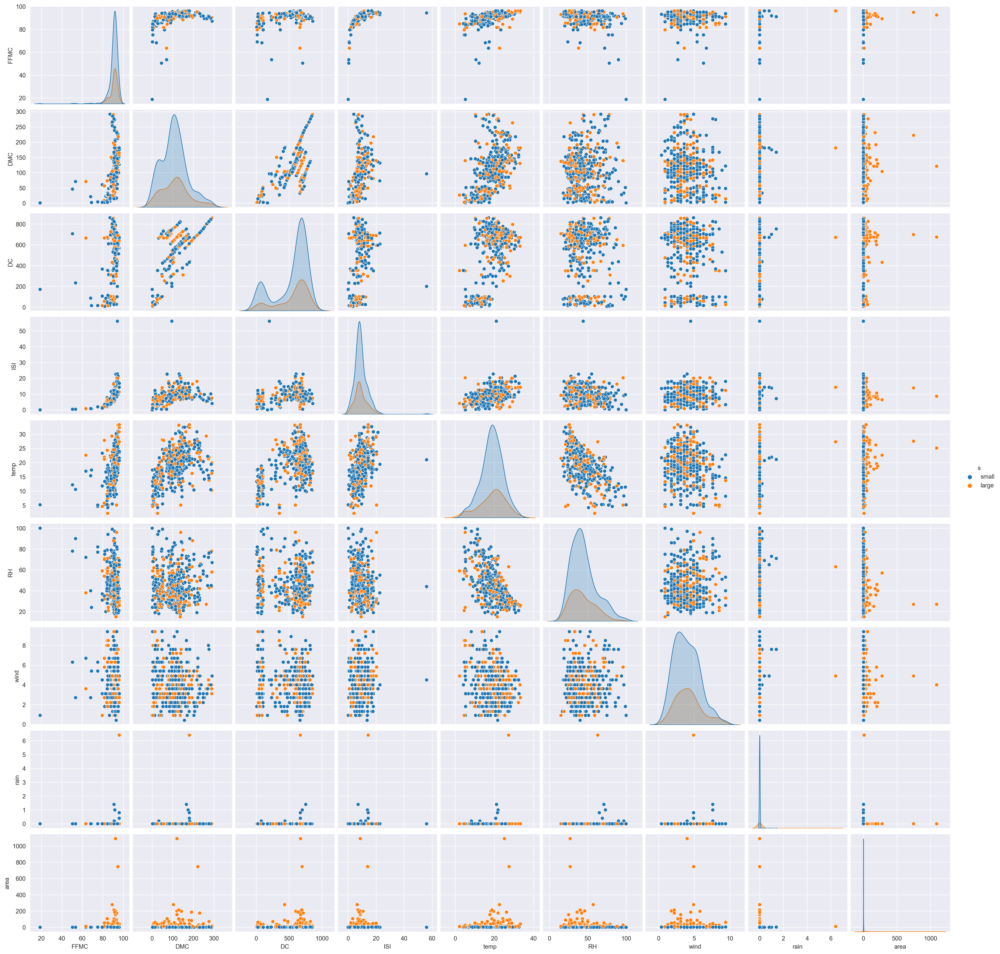

In [15]:
sns.pairplot(p, hue='s')

plt.show()

<AxesSubplot:>

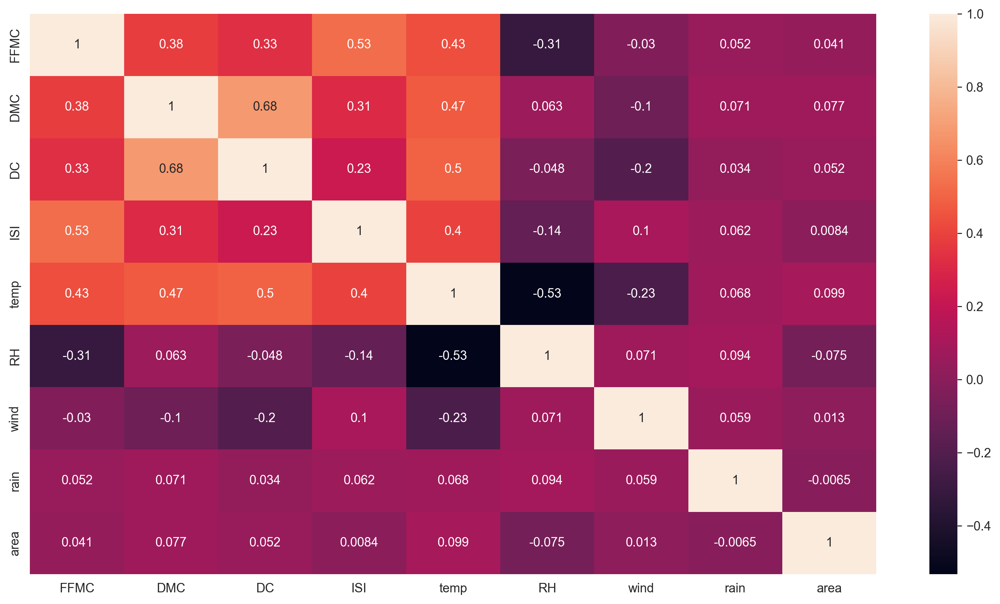

In [16]:
sns.heatmap(p.iloc[:,:-1].corr(), annot = True)

In [17]:
le = LabelEncoder()
ff['size_category'] = le.fit_transform(ff['size_category'])


In [18]:
ff

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
0,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,...,0,0,0,0,1,0,0,0,0,1
1,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,...,0,0,0,0,0,0,0,1,0,1
2,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,...,0,0,0,0,0,0,0,1,0,1
3,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,...,0,0,0,0,1,0,0,0,0,1
4,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,...,0,0,0,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
504,aug,sun,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,...,0,0,0,0,0,0,0,0,0,0
505,aug,sun,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,...,0,0,0,0,0,0,0,0,0,0
506,aug,sun,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,...,0,0,0,0,0,0,0,0,0,0
507,aug,sat,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,...,0,0,0,0,0,0,0,0,0,1


# Outlier Detection

In [19]:
def outlier_percentage(df):
    for i in range(len(df.columns)):

        q1 = df[df.columns[i]].quantile(0.25)
        q3 = df[df.columns[i]].quantile(0.75)
        iqr = q3-q1

        upper = q3 + (iqr*1.5)
        lower = q1 - (iqr*1.5)

        percentage = (((len(df[df[df.columns[i]] > upper])) +
                      (len(df[df[df.columns[i]] < lower])))/len(df[df.columns[i]]))*100

        print(str(df.columns[i]) + ' : ' + str(percentage) + ' %')

In [20]:
def replace_outlier_extream(st, col):

    q1 = st[col].quantile(0.25)
    q3 = st[col].quantile(0.75)
    iqr = q3-q1

    upper = q3 + (iqr*1.5)
    lower = q1 - (iqr*1.5)

    st[col].mask(st[col] > upper, upper, inplace=True)
    st[col].mask(st[col] < lower, lower, inplace=True)

In [21]:
def remove_outlier(st, col):
    q1 = st[col].quantile(0.25)
    q3 = st[col].quantile(0.75)
    
    iqr = q3-q1

    upper = q3 + (iqr*1.5)
    lower = q1 - (iqr*1.5)

    st = st[(st[col] > lower) & (st[col] < upper)]

    return st

In [22]:
outlier_percentage(ff.iloc[:,2:11])

FFMC : 10.412573673870334 %
DMC : 3.143418467583497 %
DC : 1.5717092337917484 %
ISI : 2.75049115913556 %
temp : 0.3929273084479371 %
RH : 2.161100196463654 %
wind : 2.5540275049115913 %
rain : 1.37524557956778 %
area : 12.180746561886052 %


In [23]:
# Using Isolation Forest
iso = IsolationForest()
iso.fit(ff.iloc[:,2:11])
outliers = iso.predict(ff.iloc[:,2:11])
outliers

array([ 1,  1,  1, -1, -1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,
        1,  1,  1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,  1,
       -1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1

In [24]:
# Creating Dataframe
ff['Outliers'] = outliers
ff

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category,Outliers
0,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,...,0,0,0,1,0,0,0,0,1,1
1,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,...,0,0,0,0,0,0,1,0,1,1
2,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,...,0,0,0,0,0,0,1,0,1,1
3,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,...,0,0,0,1,0,0,0,0,1,-1
4,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,...,0,0,0,1,0,0,0,0,1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
504,aug,sun,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,...,0,0,0,0,0,0,0,0,0,1
505,aug,sun,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,...,0,0,0,0,0,0,0,0,0,-1
506,aug,sun,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,...,0,0,0,0,0,0,0,0,0,1
507,aug,sat,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,...,0,0,0,0,0,0,0,0,1,1


In [25]:
ff.drop(ff[ff['Outliers']==-1].index, inplace=True)

In [26]:
outlier_percentage(ff.iloc[:,2:11])

FFMC : 7.592190889370933 %
DMC : 3.470715835140998 %
DC : 14.75054229934924 %
ISI : 4.3383947939262475 %
temp : 2.6030368763557483 %
RH : 1.3015184381778742 %
wind : 1.0845986984815619 %
rain : 0.21691973969631237 %
area : 11.496746203904555 %


In [27]:
# Replacing Outlier in FFMC Column
pe.box(ff['FFMC'], orientation = 'h')

replace_outlier_extream(ff, 'FFMC')

pe.box(ff['FFMC'],orientation = 'h')

In [28]:
# Replacing Outlier in DMC Column
pe.box(ff['DMC'], orientation = 'h')

replace_outlier_extream(ff, 'DMC')

pe.box(ff['DMC'], orientation = 'h')

In [29]:
# Replacing Outlier in DC Column
pe.box(ff['DC'], orientation = 'h')

replace_outlier_extream(ff, 'DC')

pe.box(ff['DC'], orientation = 'h')

In [30]:
# Replacing Outlier in ISI Column
pe.box(ff['ISI'], orientation = 'h')
replace_outlier_extream(ff, 'ISI')
pe.box(ff['ISI'], orientation = 'h')

In [31]:
# Replacing Outlier in Area Column
pe.box(ff['area'], orientation = 'h')
replace_outlier_extream(ff, 'area')
pe.box(ff['area'], orientation = 'h')

In [32]:
# Outlier Percentage (After)
outlier_percentage(ff.iloc[:,2:11])

FFMC : 0.0 %
DMC : 0.0 %
DC : 0.0 %
ISI : 0.0 %
temp : 2.6030368763557483 %
RH : 1.3015184381778742 %
wind : 1.0845986984815619 %
rain : 0.21691973969631237 %
area : 0.0 %


In [33]:
# Reindexing Columns
ff.reset_index(inplace=True)
ff.drop(columns=['index', 'Outliers'], inplace=True)

ff

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
0,mar,fri,86.9,26.2,148.55,5.1,8.2,51,6.7,0.0,...,0,0,0,0,1,0,0,0,0,1
1,oct,tue,90.6,35.4,669.10,6.7,18.0,33,0.9,0.0,...,0,0,0,0,0,0,0,1,0,1
2,oct,sat,90.6,43.7,686.90,6.7,14.6,33,1.3,0.0,...,0,0,0,0,0,0,0,1,0,1
3,aug,sun,92.3,85.3,488.00,14.7,22.2,29,5.4,0.0,...,0,0,0,0,0,0,0,0,0,1
4,aug,mon,92.3,88.9,495.60,8.5,24.1,27,3.1,0.0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
456,aug,fri,91.0,166.9,752.60,7.1,18.2,62,5.4,0.0,...,0,0,0,0,0,0,0,0,0,1
457,aug,sun,86.9,56.7,665.60,1.9,27.8,35,2.7,0.0,...,0,0,0,0,0,0,0,0,0,1
458,aug,sun,86.9,56.7,665.60,1.9,27.8,32,2.7,0.0,...,0,0,0,0,0,0,0,0,0,0
459,aug,sun,86.9,56.7,665.60,1.9,21.2,70,6.7,0.0,...,0,0,0,0,0,0,0,0,0,0


In [34]:
# Splitting The Data Into Target and Independent set
x = ff.iloc[:,2:-1]
y = ff['size_category']

In [35]:
x

,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,dayfri,...,monthdec,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep
0,86.9,26.2,148.55,5.1,8.2,51,6.7,0.0,0.00,1,...,0,0,0,0,0,1,0,0,0,0
1,90.6,35.4,669.10,6.7,18.0,33,0.9,0.0,0.00,0,...,0,0,0,0,0,0,0,0,1,0
2,90.6,43.7,686.90,6.7,14.6,33,1.3,0.0,0.00,0,...,0,0,0,0,0,0,0,0,1,0
3,92.3,85.3,488.00,14.7,22.2,29,5.4,0.0,0.00,0,...,0,0,0,0,0,0,0,0,0,0
4,92.3,88.9,495.60,8.5,24.1,27,3.1,0.0,0.00,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
456,91.0,166.9,752.60,7.1,18.2,62,5.4,0.0,0.43,1,...,0,0,0,0,0,0,0,0,0,0
457,86.9,56.7,665.60,1.9,27.8,35,2.7,0.0,0.00,0,...,0,0,0,0,0,0,0,0,0,0
458,86.9,56.7,665.60,1.9,27.8,32,2.7,0.0,6.44,0,...,0,0,0,0,0,0,0,0,0,0
459,86.9,56.7,665.60,1.9,21.2,70,6.7,0.0,11.16,0,...,0,0,0,0,0,0,0,0,0,0


In [36]:
# Normalizing The Dataset
sc = StandardScaler()
scaled_x  = pd.DataFrame(sc.fit_transform(x), columns=x.columns)
scaled_x

,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,dayfri,...,monthdec,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep
0,-2.112013,-1.512922,-2.038727,-1.095299,-2.081531,0.585563,1.747213,-0.046625,-0.687367,2.268627,...,-0.093556,-0.170346,0.0,-0.259094,-0.176974,2.967914,-0.046625,0.0,-0.183391,-0.739581
1,-0.440415,-1.347675,0.446573,-0.659472,-0.266168,-0.684764,-1.795441,-0.046625,-0.687367,-0.440795,...,-0.093556,-0.170346,0.0,-0.259094,-0.176974,-0.336937,-0.046625,0.0,5.452828,-0.739581
2,-0.440415,-1.198594,0.531556,-0.659472,-0.895988,-0.684764,-1.551120,-0.046625,-0.687367,-0.440795,...,-0.093556,-0.170346,0.0,-0.259094,-0.176974,-0.336937,-0.046625,0.0,5.452828,-0.739581
3,0.327616,-0.451390,-0.418066,1.519662,0.511844,-0.967059,0.953170,-0.046625,-0.687367,-0.440795,...,-0.093556,-0.170346,0.0,-0.259094,-0.176974,-0.336937,-0.046625,0.0,-0.183391,-0.739581
4,0.327616,-0.386728,-0.381781,-0.169167,0.863802,-1.108206,-0.451676,-0.046625,-0.687367,-0.440795,...,-0.093556,-0.170346,0.0,-0.259094,-0.176974,-0.336937,-0.046625,0.0,-0.183391,-0.739581
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
456,-0.259702,1.014279,0.845233,-0.550515,-0.229120,1.361873,0.953170,-0.046625,-0.609488,2.268627,...,-0.093556,-0.170346,0.0,-0.259094,-0.176974,-0.336937,-0.046625,0.0,-0.183391,-0.739581
457,-2.112013,-0.965093,0.429862,-1.966952,1.549194,-0.543616,-0.695997,-0.046625,-0.687367,-0.440795,...,-0.093556,-0.170346,0.0,-0.259094,-0.176974,-0.336937,-0.046625,0.0,-0.183391,-0.739581
458,-2.112013,-0.965093,0.429862,-1.966952,1.549194,-0.755337,-0.695997,-0.046625,0.479004,-0.440795,...,-0.093556,-0.170346,0.0,-0.259094,-0.176974,-0.336937,-0.046625,0.0,-0.183391,-0.739581
459,-2.112013,-0.965093,0.429862,-1.966952,0.326603,1.926463,1.747213,-0.046625,1.333860,-0.440795,...,-0.093556,-0.170346,0.0,-0.259094,-0.176974,-0.336937,-0.046625,0.0,-0.183391,-0.739581


<AxesSubplot:ylabel='Frequency'>

<Figure size 2500x2500 with 0 Axes>

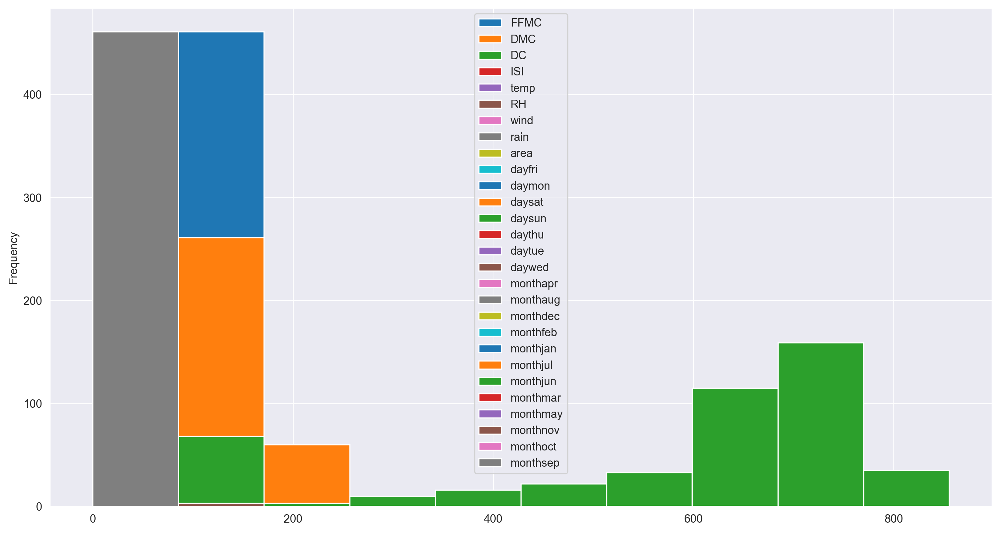

In [37]:
plt.figure(figsize=(10,10))
x.plot(kind="hist")

In [38]:
y.value_counts()

1    343
0    118
Name: size_category, dtype: int64

<AxesSubplot:>

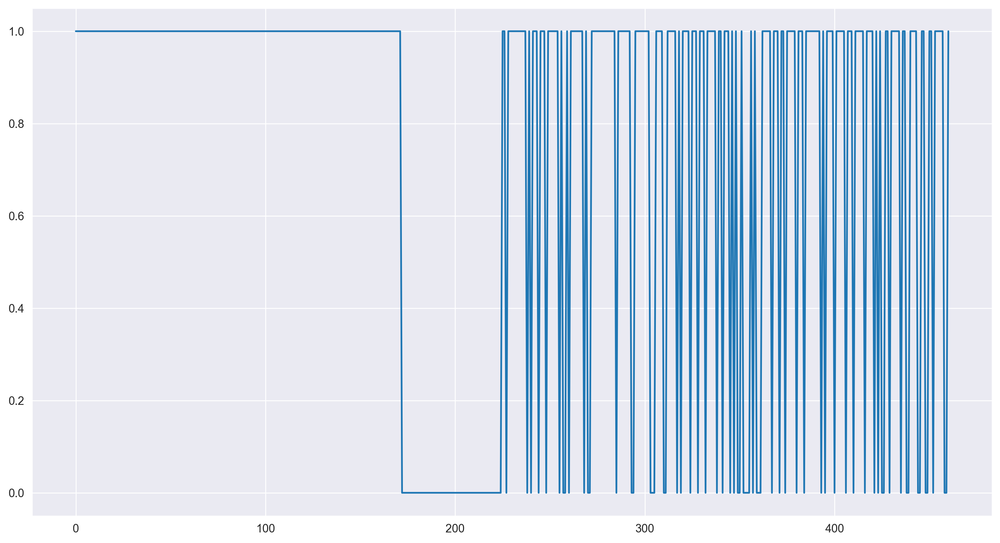

In [39]:
y.plot()

In [40]:
xtrain,xtest,ytrain,ytest = train_test_split(scaled_x,y,train_size=0.75,random_state=1)
xtrain.shape,ytrain.shape

((345, 28), (345,))

In [41]:
xtest.shape,ytest.shape

((116, 28), (116,))

# Model Building

In [42]:
def creat_model():
    model = Sequential()
    model.add(Dense(8, input_dim = 28,kernel_initializer='uniform', activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(4,kernel_initializer='uniform', activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(1,kernel_initializer='uniform', activation='sigmoid'))
    adam = Adam(learning_rate=0.001)
    model.compile(loss='binary_crossentropy',optimizer = adam,metrics='accuracy')
    return model

In [43]:
model = KerasClassifier(build_fn=creat_model,verbose = 0)
batch_size = [10,30,50]
epochs = [10,20,50]
param_grid = dict(batch_size = batch_size,epochs = epochs)
gsv = GridSearchCV(estimator=model,param_grid=param_grid,cv = KFold(),verbose=5)
gsv_res = gsv.fit(xtrain,ytrain)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV 1/5] END ..........batch_size=10, epochs=10;, score=0.899 total time=   1.4s
[CV 2/5] END ..........batch_size=10, epochs=10;, score=0.812 total time=   0.8s
[CV 3/5] END ..........batch_size=10, epochs=10;, score=0.667 total time=   0.8s
[CV 4/5] END ..........batch_size=10, epochs=10;, score=0.797 total time=   0.8s
[CV 5/5] END ..........batch_size=10, epochs=10;, score=0.754 total time=   0.8s
[CV 1/5] END ..........batch_size=10, epochs=20;, score=0.986 total time=   1.0s
[CV 2/5] END ..........batch_size=10, epochs=20;, score=0.957 total time=   1.0s
[CV 3/5] END ..........batch_size=10, epochs=20;, score=0.913 total time=   1.0s
[CV 4/5] END ..........batch_size=10, epochs=20;, score=0.971 total time=   1.0s
[CV 5/5] END ..........batch_size=10, epochs=20;, score=0.754 total time=   1.0s
[CV 1/5] END ..........batch_size=10, epochs=50;, score=0.986 total time=   1.6s
[CV 2/5] END ..........batch_size=10, epochs=50;,

In [44]:
print(gsv_res.best_params_,gsv_res.best_score_)

{'batch_size': 10, 'epochs': 50} 0.9594202995300293


In [45]:
#Turning Hyperparameter: Learning rate and Dropout rate
def creat_model(learning_rate,dropout_rate):
    model = Sequential()
    model.add(Dense(8, input_dim = 28,kernel_initializer='uniform', activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(4,kernel_initializer='uniform', activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(1,kernel_initializer='uniform', activation='sigmoid'))
    adam = Adam(learning_rate=learning_rate)
    model.compile(loss='binary_crossentropy',optimizer = adam,metrics='accuracy')
    return model

In [46]:
model = KerasClassifier(build_fn=creat_model,batch_size = 10,epochs = 50,verbose = 0)
learning_rate = [0.1,0.01,0.001]
dropout_rate = [0.0,0.1,0.2]
param_grid = dict(learning_rate = learning_rate,dropout_rate = dropout_rate)
gsv = GridSearchCV(estimator=model,param_grid=param_grid,cv= KFold(),verbose=5)
gsv_r = gsv.fit(xtrain,ytrain)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV 1/5] END dropout_rate=0.0, learning_rate=0.1;, score=0.899 total time=   1.8s
[CV 2/5] END dropout_rate=0.0, learning_rate=0.1;, score=0.812 total time=   1.7s
[CV 3/5] END dropout_rate=0.0, learning_rate=0.1;, score=0.928 total time=   1.6s
[CV 4/5] END dropout_rate=0.0, learning_rate=0.1;, score=0.797 total time=   1.6s
[CV 5/5] END dropout_rate=0.0, learning_rate=0.1;, score=0.986 total time=   1.6s
[CV 1/5] END dropout_rate=0.0, learning_rate=0.01;, score=0.986 total time=   1.5s
[CV 2/5] END dropout_rate=0.0, learning_rate=0.01;, score=0.913 total time=   1.6s
[CV 3/5] END dropout_rate=0.0, learning_rate=0.01;, score=0.928 total time=   1.6s
[CV 4/5] END dropout_rate=0.0, learning_rate=0.01;, score=0.986 total time=   1.6s
[CV 5/5] END dropout_rate=0.0, learning_rate=0.01;, score=0.942 total time=   1.6s
[CV 1/5] END dropout_rate=0.0, learning_rate=0.001;, score=0.971 total time=   1.6s
[CV 2/5] END dropout_rate=0.0, 

In [47]:
def creat_model(Activation_Function,init):
    model = Sequential()
    model.add(Dense(8, input_dim = 28,kernel_initializer='uniform', activation='relu'))
    model.add(Dropout(0.1))
    model.add(Dense(4,kernel_initializer='uniform', activation='relu'))
    model.add(Dropout(0.1))
    model.add(Dense(1,kernel_initializer='uniform', activation='sigmoid'))
    adam = Adam(learning_rate=0.001)
    model.compile(loss='binary_crossentropy',optimizer = adam,metrics='accuracy')
    return model

In [48]:
model = KerasClassifier(build_fn=creat_model,batch_size = 10,epochs = 50,verbose = 0)
Activation_Function = ['relu','tanh','softmax','linear']
init = ['zero','uniform','normal']
param_grid = dict(Activation_Function = Activation_Function,init = init)
gsv = GridSearchCV(estimator=model,param_grid=param_grid,cv= KFold(),verbose=5)
gsv_result = gsv.fit(xtrain,ytrain)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5] END Activation_Function=relu, init=zero;, score=0.971 total time=   1.6s
[CV 2/5] END Activation_Function=relu, init=zero;, score=0.942 total time=   1.6s
[CV 3/5] END Activation_Function=relu, init=zero;, score=0.928 total time=   1.6s
[CV 4/5] END Activation_Function=relu, init=zero;, score=0.986 total time=   1.6s
[CV 5/5] END Activation_Function=relu, init=zero;, score=0.957 total time=   1.6s
[CV 1/5] END Activation_Function=relu, init=uniform;, score=0.971 total time=   1.6s
[CV 2/5] END Activation_Function=relu, init=uniform;, score=0.928 total time=   1.6s
[CV 3/5] END Activation_Function=relu, init=uniform;, score=0.957 total time=   1.6s
[CV 4/5] END Activation_Function=relu, init=uniform;, score=0.986 total time=   1.6s
[CV 5/5] END Activation_Function=relu, init=uniform;, score=0.942 total time=   1.6s
[CV 1/5] END Activation_Function=relu, init=normal;, score=0.971 total time=   1.6s
[CV 2/5] END Activat

In [49]:
# Tuning of Hyperparameter :Number of Neurons in hidden layer

def creat_model(neuron1,neuron2):
    model = Sequential()
    model.add(Dense(8,input_dim=28,kernel_initializer='normal', activation='tanh'))
    model.add(Dropout(0.1))
    model.add(Dense(4,kernel_initializer='normal',activation='tanh'))
    model.add(Dropout(0.1))
    model.add(Dense(1,kernel_initializer='normal',activation='sigmoid'))
    adam = Adam(learning_rate=0.001)
    model.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])
    return model

In [50]:
model = KerasClassifier(build_fn=creat_model,batch_size = 10,epochs = 50,verbose = 0)
neuron1 = [24,16,8]
neuron2 = [12,8,4]
param_grid = dict(neuron1 = neuron1,neuron2=neuron2)
gsv = GridSearchCV(estimator=model,param_grid=param_grid,cv=KFold(),verbose=5)
gsv_n = gsv.fit(xtrain,ytrain)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV 1/5] END ............neuron1=24, neuron2=12;, score=0.986 total time=   1.6s
[CV 2/5] END ............neuron1=24, neuron2=12;, score=0.957 total time=   1.6s
[CV 3/5] END ............neuron1=24, neuron2=12;, score=0.928 total time=   1.6s
[CV 4/5] END ............neuron1=24, neuron2=12;, score=0.986 total time=   1.6s
[CV 5/5] END ............neuron1=24, neuron2=12;, score=0.957 total time=   1.6s
[CV 1/5] END .............neuron1=24, neuron2=8;, score=0.986 total time=   1.6s
[CV 2/5] END .............neuron1=24, neuron2=8;, score=0.957 total time=   1.6s
[CV 3/5] END .............neuron1=24, neuron2=8;, score=0.928 total time=   1.6s
[CV 4/5] END .............neuron1=24, neuron2=8;, score=0.986 total time=   1.6s
[CV 5/5] END .............neuron1=24, neuron2=8;, score=0.957 total time=   1.6s
[CV 1/5] END .............neuron1=24, neuron2=4;, score=0.986 total time=   1.6s
[CV 2/5] END .............neuron1=24, neuron2=4;,

In [51]:
print(gsv_n.best_score_,gsv_n.best_params_)

0.9623188495635986 {'neuron1': 24, 'neuron2': 12}


# Train a model with optimum values of hyperparameter

In [52]:
# best Parameters
# batch_size = 10
# epochs = 50
# dropout_rate = 0.1
# learning rate = 0.001
# activation_function = tanh
# kernel_initiative = normal
# neuron1 = 8
# neuron2 = 8

In [53]:
def creat_model():
    model = Sequential()
    model.add(Dense(8,input_dim=28,kernel_initializer='normal', activation='tanh'))
    model.add(Dropout(0.1))
    model.add(Dense(8,kernel_initializer='normal',activation='tanh'))
    model.add(Dropout(0.1))
    model.add(Dense(1,kernel_initializer='normal',activation='sigmoid'))
    adam = Adam(learning_rate=0.001)
    model.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])
    return model

In [54]:
model = KerasClassifier(build_fn=creat_model,batch_size = 10,epochs = 50)
model.fit(xtrain,ytrain)

Epoch 1/50
35/35 [==============================] - 1s 836us/step - loss: 0.6869 - accuracy: 0.7362
Epoch 2/50
35/35 [==============================] - 0s 821us/step - loss: 0.6671 - accuracy: 0.7565
Epoch 3/50
35/35 [==============================] - 0s 1ms/step - loss: 0.6217 - accuracy: 0.7739
Epoch 4/50
35/35 [==============================] - 0s 1ms/step - loss: 0.5234 - accuracy: 0.8580
Epoch 5/50
35/35 [==============================] - 0s 1ms/step - loss: 0.3959 - accuracy: 0.9014
Epoch 6/50
35/35 [==============================] - 0s 939us/step - loss: 0.2940 - accuracy: 0.9246
Epoch 7/50
35/35 [==============================] - 0s 880us/step - loss: 0.2173 - accuracy: 0.9420
Epoch 8/50
35/35 [==============================] - 0s 880us/step - loss: 0.1734 - accuracy: 0.9623
Epoch 9/50
35/35 [==============================] - 0s 909us/step - loss: 0.1436 - accuracy: 0.9681
Epoch 10/50
35/35 [==============================] - 0s 851us/step - loss: 0.1184 - accuracy: 0.9739
Epoch

In [55]:
y_predict = model.predict(xtrain)

11/11 [==============================] - 0s 598us/step


In [56]:
accuracy_score(ytrain,y_predict)

1.0

In [57]:
confusion_matrix(ytrain,y_predict)

array([[ 84,   0],
       [  0, 261]], dtype=int64)

In [58]:
print(classification_report(ytrain,y_predict))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        84
           1       1.00      1.00      1.00       261

    accuracy                           1.00       345
   macro avg       1.00      1.00      1.00       345
weighted avg       1.00      1.00      1.00       345



In [59]:
# testing data
y_test_pred = model.predict(xtest)

4/4 [==============================] - 0s 998us/step


In [60]:
accuracy_score(ytest,y_test_pred)

0.9741379310344828

In [61]:
confusion_matrix(ytest,y_test_pred)

array([[32,  2],
       [ 1, 81]], dtype=int64)

In [62]:
print(classification_report(ytest,y_test_pred))

              precision    recall  f1-score   support

           0       0.97      0.94      0.96        34
           1       0.98      0.99      0.98        82

    accuracy                           0.97       116
   macro avg       0.97      0.96      0.97       116
weighted avg       0.97      0.97      0.97       116

